In [ ]:

from gensim.models import Word2Vec
import pandas as pd
import re
import numpy as np
from matplotlib import pyplot as plt

from sklearn.decomposition import PCA
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

In [ ]:
sentences = [['i', 'like', 'apple', 'pie', 'for', 'dessert'],
            ['i', 'dont', 'drive', 'fast', 'cars'],
            ['data', 'science', 'is', 'fun'],
            ['chocolate', 'is', 'my', 'favorite'],
            ['my', 'favorite', 'movie', 'is', 'predator']]

In [ ]:

# train word2vec model
w2v = Word2Vec(sentences, min_count=1, size = 5)
print(w2v)


Word2Vec(vocab=19, size=5, alpha=0.025)


In [ ]:
# summarize vocabulary
words1 = list(w2v.wv.vocab)
print(words1)
w2v.wv.vocab

['i', 'like', 'apple', 'pie', 'for', 'dessert', 'dont', 'drive', 'fast', 'cars', 'data', 'science', 'is', 'fun', 'chocolate', 'my', 'favorite', 'movie', 'predator']


{'apple': <gensim.models.keyedvectors.Vocab at 0x7fc090246f50>,
 'cars': <gensim.models.keyedvectors.Vocab at 0x7fc09024f0d0>,
 'chocolate': <gensim.models.keyedvectors.Vocab at 0x7fc09024f2d0>,
 'data': <gensim.models.keyedvectors.Vocab at 0x7fc09024f1d0>,
 'dessert': <gensim.models.keyedvectors.Vocab at 0x7fc09024f110>,
 'dont': <gensim.models.keyedvectors.Vocab at 0x7fc09024f150>,
 'drive': <gensim.models.keyedvectors.Vocab at 0x7fc09024f190>,
 'fast': <gensim.models.keyedvectors.Vocab at 0x7fc09024f050>,
 'favorite': <gensim.models.keyedvectors.Vocab at 0x7fc09024f350>,
 'for': <gensim.models.keyedvectors.Vocab at 0x7fc09024f090>,
 'fun': <gensim.models.keyedvectors.Vocab at 0x7fc09024f290>,
 'i': <gensim.models.keyedvectors.Vocab at 0x7fc090246ed0>,
 'is': <gensim.models.keyedvectors.Vocab at 0x7fc09024f250>,
 'like': <gensim.models.keyedvectors.Vocab at 0x7fc090246f90>,
 'movie': <gensim.models.keyedvectors.Vocab at 0x7fc09024f390>,
 'my': <gensim.models.keyedvectors.Vocab at 0x7

In [ ]:
# access vector for one word
print(w2v['chocolate'])
print(w2v['dessert'])

[-0.00974875 -0.01716916  0.02624541  0.06555061 -0.00564072]
[ 0.04485498  0.06198195 -0.00441741  0.02305362 -0.03524888]


[[-0.03464138 -0.06173683 -0.08714142 -0.06899389 -0.03121414]
 [-0.02137923 -0.00669583 -0.04373405  0.06559018 -0.04897941]
 [-0.04892839 -0.05098382  0.08322984  0.04207538 -0.0719507 ]
 [ 0.03344106 -0.07223509 -0.00761687 -0.0144429  -0.06406458]
 [ 0.09508843 -0.07272739 -0.02552406  0.05177441  0.01169507]
 [ 0.04485498  0.06198195 -0.00441741  0.02305362 -0.03524888]
 [-0.05164879 -0.03503165 -0.09422134 -0.00841196  0.03562527]
 [ 0.08423065 -0.0243143   0.05400156  0.03124536 -0.09954465]
 [-0.02377439  0.09545178  0.05156517 -0.08501218  0.04103066]
 [ 0.03254965 -0.09525035 -0.08971795 -0.02342065  0.08197059]
 [-0.04480827 -0.03036647 -0.04461136  0.07099059 -0.06607588]
 [-0.06900533 -0.06340463  0.01366008  0.07525446  0.01626229]
 [-0.05827764  0.07258556  0.05338566  0.09875645  0.00018551]
 [-0.06604812  0.04362072  0.08282761  0.02230112 -0.0350793 ]
 [-0.00974875 -0.01716916  0.02624541  0.06555061 -0.00564072]
 [ 0.09835795  0.0720796   0.05184053 -0.01423434  0.01

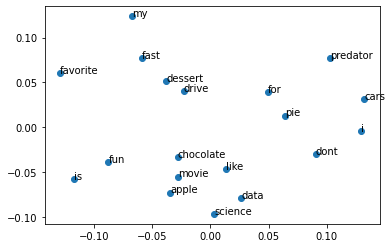

In [ ]:
X = w2v[w2v.wv.vocab]
print(X) #19*5
pca = PCA(n_components=2)

result = pca.fit_transform(X)
print(result)

# create a scatter plot of the projection
plt.scatter(result[:, 0], result[:, 1])
words = list(w2v.wv.vocab)

for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))

plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/emails.csv')
df.head()
#df['spam'].value_counts()

,text,spam
0,Subject: naturally irresistible your corporate...,1
1,Subject: the stock trading gunslinger fanny i...,1
2,Subject: unbelievable new homes made easy im ...,1
3,Subject: 4 color printing special request add...,1
4,"Subject: do not have money , get software cds ...",1


In [ ]:
df['text'][0]

"Subject: naturally irresistible your corporate identity  lt is really hard to recollect a company : the  market is full of suqgestions and the information isoverwhelminq ; but a good  catchy logo , stylish statlonery and outstanding website  will make the task much easier .  we do not promise that havinq ordered a iogo your  company will automaticaily become a world ieader : it isguite ciear that  without good products , effective business organization and practicable aim it  will be hotat nowadays market ; but we do promise that your marketing efforts  will become much more effective . here is the list of clear  benefits : creativeness : hand - made , original logos , specially done  to reflect your distinctive company image . convenience : logo and stationery  are provided in all formats ; easy - to - use content management system letsyou  change your website content and even its structure . promptness : you  will see logo drafts within three business days . affordability : your  ma

In [ ]:
clean_txt = []
for w in range(len(df.text)):
    desc = df['text'][w].lower()
    
    #remove punctuation
    desc = re.sub('[^a-zA-Z]', ' ', desc)
    
    #remove tags
    #desc=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",desc)
    
    #remove digits and special chars
    desc=re.sub("(\\d|\\W)+"," ",desc)
    clean_txt.append(desc)

df['clean'] = clean_txt

In [ ]:
df.head()
df['clean'][0]

'subject naturally irresistible your corporate identity lt is really hard to recollect a company the market is full of suqgestions and the information isoverwhelminq but a good catchy logo stylish statlonery and outstanding website will make the task much easier we do not promise that havinq ordered a iogo your company will automaticaily become a world ieader it isguite ciear that without good products effective business organization and practicable aim it will be hotat nowadays market but we do promise that your marketing efforts will become much more effective here is the list of clear benefits creativeness hand made original logos specially done to reflect your distinctive company image convenience logo and stationery are provided in all formats easy to use content management system letsyou change your website content and even its structure promptness you will see logo drafts within three business days affordability your marketing break through shouldn t make gaps in your budget sat

In [ ]:
corpus = []
for col in df.clean:
    word_list = col.split(" ")
    corpus.append(word_list)
corpus[0:1]

[['subject',
  'naturally',
  'irresistible',
  'your',
  'corporate',
  'identity',
  'lt',
  'is',
  'really',
  'hard',
  'to',
  'recollect',
  'a',
  'company',
  'the',
  'market',
  'is',
  'full',
  'of',
  'suqgestions',
  'and',
  'the',
  'information',
  'isoverwhelminq',
  'but',
  'a',
  'good',
  'catchy',
  'logo',
  'stylish',
  'statlonery',
  'and',
  'outstanding',
  'website',
  'will',
  'make',
  'the',
  'task',
  'much',
  'easier',
  'we',
  'do',
  'not',
  'promise',
  'that',
  'havinq',
  'ordered',
  'a',
  'iogo',
  'your',
  'company',
  'will',
  'automaticaily',
  'become',
  'a',
  'world',
  'ieader',
  'it',
  'isguite',
  'ciear',
  'that',
  'without',
  'good',
  'products',
  'effective',
  'business',
  'organization',
  'and',
  'practicable',
  'aim',
  'it',
  'will',
  'be',
  'hotat',
  'nowadays',
  'market',
  'but',
  'we',
  'do',
  'promise',
  'that',
  'your',
  'marketing',
  'efforts',
  'will',
  'become',
  'much',
  'more',
  

In [ ]:
model = Word2Vec(corpus, min_count=2, size = 56)
model

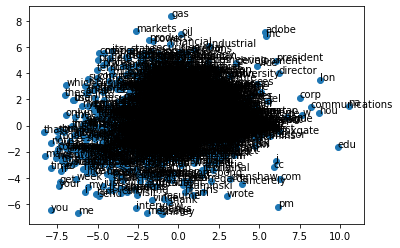

In [ ]:
X = model[model.wv.vocab]

pca = PCA(n_components=2)

result = pca.fit_transform(X)

# create a scatter plot of the projection
plt.scatter(result[:, 0], result[:, 1])
words = list(model.wv.vocab)

for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))

plt.show()

In [ ]:
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)

#create df from the pca results
pca_df = pd.DataFrame(result, columns = ['x','y'])

#add the words for the hover effect
pca_df['word'] = words
pca_df.head()

,x,y,word
0,2.706366,-2.102819,subject
1,-0.142861,0.240915,naturally
2,0.063242,-0.211113,irresistible
3,-7.387988,-4.666512,your
4,-0.093175,3.443357,corporate


In [ ]:
N = 1000000
words = list(model.wv.vocab)
fig = go.Figure(data=go.Scattergl(
    x = pca_df['x'],
    y = pca_df['y'],
    mode='markers',
    marker=dict(
        color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    ),
    text=pca_df['word'],
    textposition="bottom center"
))

fig.show()

In [ ]:
model.wv.most_similar('amazon')

[('britannica', 0.9178186655044556),
 ('pagenetips', 0.8830881714820862),
 ('aol', 0.8802474737167358),
 ('nlipinski', 0.8600983023643494),
 ('woodybc', 0.8597217202186584),
 ('mnash', 0.8588612079620361),
 ('jkalbach', 0.8516045808792114),
 ('mailto', 0.8435548543930054),
 ('sina', 0.8431150913238525),
 ('hesinet', 0.8397704362869263)]

In [ ]:
model.wv.most_similar('start')

[('come', 0.8254891633987427),
 ('move', 0.8066425323486328),
 ('put', 0.7901952862739563),
 ('turn', 0.7679370641708374),
 ('get', 0.7474022507667542),
 ('sign', 0.7468220591545105),
 ('getting', 0.7464439272880554),
 ('back', 0.7437900304794312),
 ('place', 0.7379489541053772),
 ('stay', 0.7356045246124268)]

In [ ]:
model.wv.most_similar_cosmul(positive = ['phone', 'number'], negative = ['call'])

[('address', 1.1033047437667847),
 ('name', 1.0619056224822998),
 ('occupation', 1.0399136543273926),
 ('amoine', 1.0041030645370483),
 ('machine', 1.0025019645690918),
 ('addresses', 1.0022950172424316),
 ('hardcopies', 0.9956192970275879),
 ('phonemail', 0.9933369755744934),
 ('inclusive', 0.9834359884262085),
 ('daytime', 0.9750474691390991)]

In [ ]:
model.wv.doesnt_match("phone number prison cell".split())

'prison'

In [ ]:
#save embeddings
file = 'email_embd.txt'
model.wv.save_word2vec_format(file, binary = False)

In [ ]:
import nltk

class MyTokenizer:
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        transformed_X = []
        for document in X:
            tokenized_doc = []
            for sent in nltk.sent_tokenize(document):
                tokenized_doc += nltk.word_tokenize(sent)
            transformed_X.append(np.array(tokenized_doc))
        return np.array(transformed_X)
    
    def fit_transform(self, X, y=None):
        return self.transform(X)

class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(word2vec.wv.syn0[0])

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = MyTokenizer().fit_transform(X)
        
        return np.array([
            np.mean([self.word2vec.wv[w] for w in words if w in self.word2vec.wv]
                    or [np.zeros(self.dim)], axis=0)
            for words in X
        ])
    
    def fit_transform(self, X, y=None):
        return self.transform(X)

In [ ]:
nltk.download('punkt')
mean_embedding_vectorizer = MeanEmbeddingVectorizer(model)
mean_embedded = mean_embedding_vectorizer.fit_transform(df['clean'])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
mean_embedded[0]

array([-0.04778013,  0.77736264, -0.68943626, -0.5412943 ,  1.6081033 ,
        0.1084224 , -0.643281  , -0.7451143 , -0.26069853, -0.88108885,
        0.9594479 ,  0.13804345, -1.1316378 , -0.42094055, -0.3084374 ,
        0.7069929 , -0.04776745,  0.10619541,  0.59376615,  0.48735347,
        0.97589433,  0.478385  , -0.7758234 , -0.4300295 , -0.12849228,
       -0.36060846,  0.28998053, -0.13222335, -1.0402308 ,  0.52275896,
       -0.45325366,  0.22839777,  0.66511583, -0.38785517, -1.0580528 ,
        0.83826184, -0.20890966,  0.0679656 ,  0.21182434, -0.1063229 ,
       -0.25764233,  0.32140255, -0.9265785 , -1.1026512 ,  0.23826489,
       -0.04833569,  0.7697211 , -0.8546973 ,  0.49180275,  0.8497135 ,
       -0.99031717, -0.6087111 ,  0.10892905,  0.35326228, -0.60257465,
       -0.39407346], dtype=float32)

In [ ]:
df['array'] = list(mean_embedded)
df

,text,spam,clean,array
0,Subject: naturally irresistible your corporate...,1,subject naturally irresistible your corporate ...,"[-0.04778013, 0.77736264, -0.68943626, -0.5412..."
1,Subject: the stock trading gunslinger fanny i...,1,subject the stock trading gunslinger fanny is ...,"[0.1880371, 0.27392668, -0.44963512, -0.228201..."
2,Subject: unbelievable new homes made easy im ...,1,subject unbelievable new homes made easy im wa...,"[0.21516657, 0.7663251, -0.65039676, -0.827213..."
3,Subject: 4 color printing special request add...,1,subject color printing special request additio...,"[0.026024265, 0.6352377, -0.6772332, -0.418975..."
4,"Subject: do not have money , get software cds ...",1,subject do not have money get software cds fro...,"[0.29230696, 0.776973, -0.9522791, -0.4575743,..."
...,...,...,...,...
5723,Subject: re : research and development charges...,0,subject re research and development charges to...,"[0.15766822, -0.37851194, 0.20000604, -1.03562..."
5724,"Subject: re : receipts from visit jim , than...",0,subject re receipts from visit jim thanks agai...,"[0.10042323, 0.4194819, -0.45358282, -0.467206..."
5725,Subject: re : enron case study update wow ! a...,0,subject re enron case study update wow all on ...,"[0.38440225, 0.5554236, -0.32301283, -0.850137..."
5726,"Subject: re : interest david , please , call...",0,subject re interest david please call shirley ...,"[0.33997732, -0.7626729, 0.3295567, -1.4857645..."
